# OFF - Nutrition Table Extractor

In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt

import json
from pprint import pprint
import yaml
from constants import sample_img_ids_v0
from tools import explore_image

Populating the interactive namespace from numpy and matplotlib


## Config

<div class="alert alert-block alert-info">
  
The original dataset was split into 4 directories described below:
<ul> 
    <li> <strong>image_files</strong>: original image: <strong>20257 images</strong> </li> 
    <li> <strong>json_files</strong>: json containing the nutrition table: <strong>20257 files</strong> </li> 
    <li> <strong>cropped_images</strong>: cropped image: <strong>20255 images</strong></li> 
    <li> <strong>cropped_json_files</strong>: of cropped image containing extra </li> information about the crop boxes coordinates <strong>9980 files</strong>

</ul>

A bash script will soon be available to automatically perform this partition

</div>

In [2]:
with open("config.yml", "r") as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)
    
base_path = cfg["base_path"]

image id: 000000001576


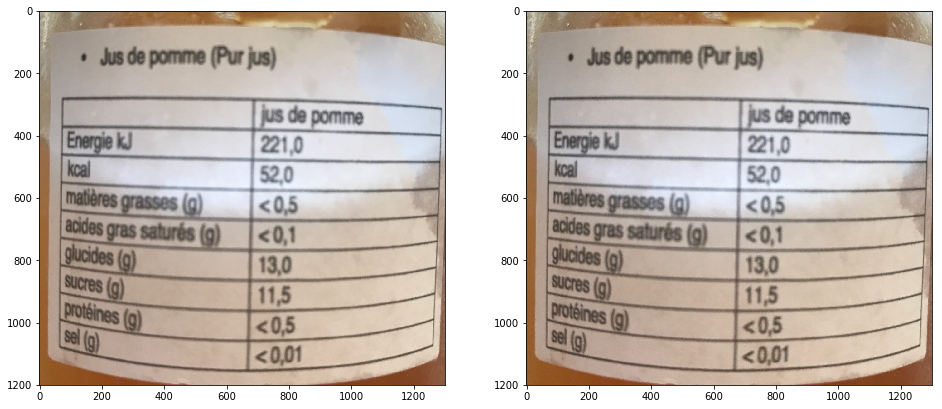

{'proteins_100g': 0.5, 'fat': 0.5, 'salt_100g': 0.01, 'carbohydrates_value': 0.01, 'saturated-fat_100g': 0.1, 'sodium_unit': 'g', 'proteins': 0.5, 'sodium_value': 0.004, 'sugars': 0.01, 'sodium_100g': 0.004, 'salt_unit': 'g', 'sugars_value': 0.01, 'salt_value': 0.01, 'fat_value': 0.5, 'sodium': 0.004, 'salt': 0.01, 'fat_unit': 'g', 'fat_100g': 0.5, 'carbohydrates_unit': 'g', 'carbohydrates_100g': 0.01, 'proteins_value': 0.5, 'saturated-fat_value': 0.1, 'proteins_unit': 'g', 'energy_value': 221, 'carbohydrates': 0.01, 'saturated-fat_unit': 'g', 'sugars_100g': 0.01, 'energy_unit': 'kcal', 'sugars_unit': 'g', 'energy_100g': 925, 'saturated-fat': 0.1, 'energy': 925}
--------------------------------------------------
****************************************************************************************************
image id: 0000247016406


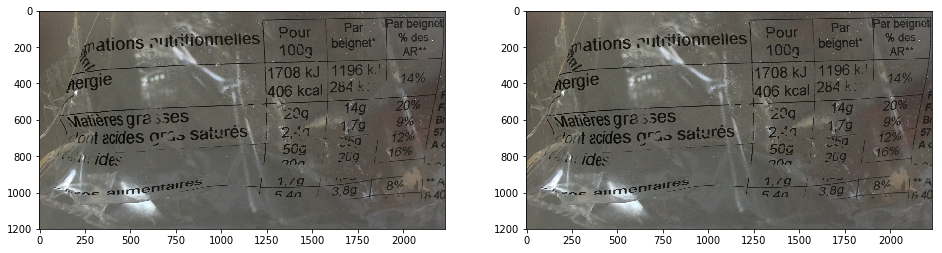

{'fat': 20, 'salt_100g': 0, 'proteins_100g': 0, 'sodium_unit': 'g', 'proteins': 0, 'carbohydrates_value': 50, 'saturated-fat_100g': 2.4, 'sodium_100g': 0, 'salt_unit': '', 'sodium_value': 0, 'sugars': 5.4, 'fat_value': 20, 'sodium': 0, 'sugars_value': 5.4, 'salt_value': 0, 'fat_unit': '', 'carbohydrates_unit': '', 'fat_100g': 20, 'carbohydrates_100g': 50, 'salt': 0, 'proteins_unit': '', 'energy_value': 406, 'proteins_value': 0, 'saturated-fat_value': 2.4, 'sugars_100g': 5.4, 'energy_unit': 'kcal', 'saturated-fat_unit': '', 'carbohydrates': 50, 'saturated-fat': 2.4, 'energy': 1699, 'sugars_unit': '', 'energy_100g': 1699}
--------------------------------------------------
****************************************************************************************************
image id: 0000901881036


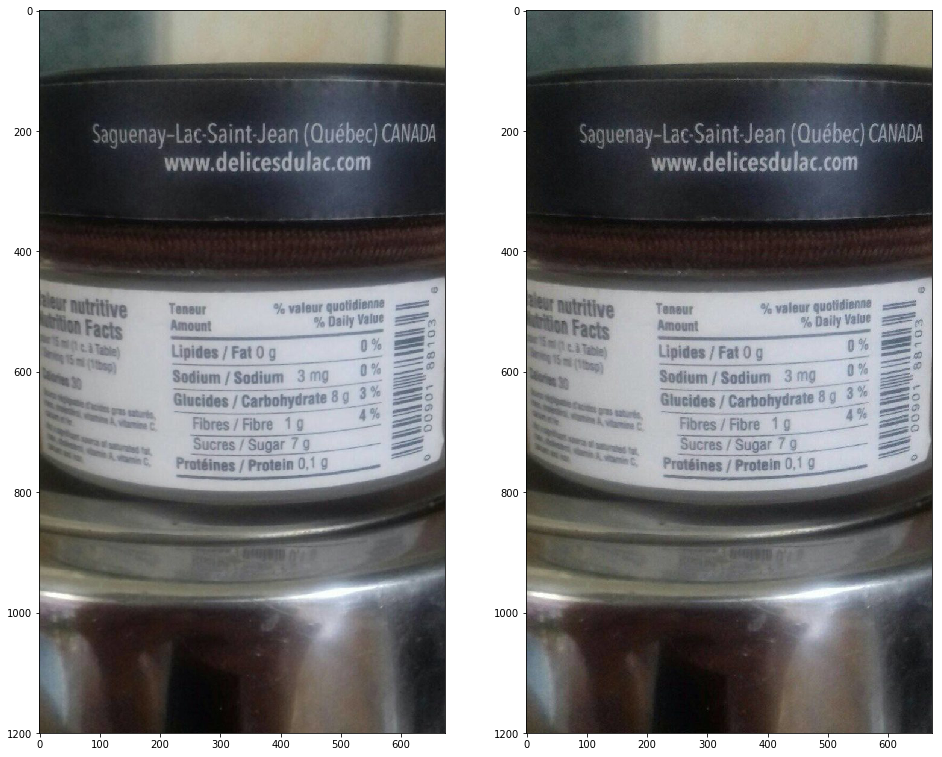

{'proteins': 0.1, 'sodium_unit': 'g', 'saturated-fat_100g': 0, 'carbohydrates_value': 8, 'salt_100g': 0, 'fat': 0, 'proteins_100g': 0.1, 'sodium': 0, 'fat_value': 0, 'salt_value': 0, 'sugars_value': 7, 'salt_unit': '', 'sodium_100g': 0, 'sugars': 7, 'sodium_value': 0, 'energy_value': 30, 'proteins_unit': '', 'saturated-fat_value': 0, 'proteins_value': 0.1, 'carbohydrates_100g': 8, 'carbohydrates_unit': '', 'fat_100g': 0, 'fat_unit': '', 'salt': 0, 'energy': 126, 'saturated-fat': 0, 'energy_100g': 126, 'sugars_unit': '', 'energy_unit': 'kcal', 'sugars_100g': 7, 'carbohydrates': 8, 'saturated-fat_unit': ''}
--------------------------------------------------
****************************************************************************************************
image id: 00011730


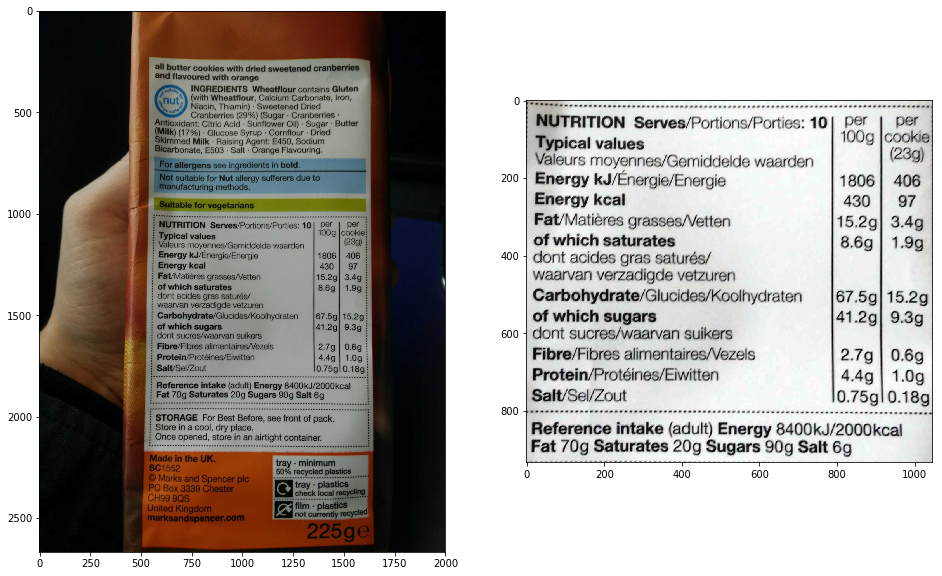

{'nova-group_serving': 4, 'fat_serving': 3.5, 'proteins_serving': 1.01, 'fiber_100g': 2.7, 'salt': 0.75, 'carbohydrates_serving': 15.5, 'nutrition-score-fr_serving': 23, 'fat_unit': 'g', 'fat_100g': 15.2, 'carbohydrates_unit': 'g', 'carbohydrates_100g': 67.5, 'proteins_value': 4.4, 'saturated-fat_value': 8.6, 'nova-group': 4, 'saturated-fat_serving': 1.98, 'proteins_unit': 'g', 'fiber_serving': 0.621, 'energy_value': 430, 'carbohydrates': 67.5, 'saturated-fat_unit': 'g', 'sodium_serving': 0.069, 'sugars_100g': 41.2, 'nutrition-score-uk_100g': 23, 'energy_unit': 'kcal', 'sugars_unit': 'g', 'energy_100g': 1799, 'saturated-fat': 8.6, 'nutrition-score-uk': 23, 'energy': 1799, 'fiber': 2.7, 'nutrition-score-uk_serving': 23, 'proteins_100g': 4.4, 'nutrition-score-fr_100g': 23, 'fat': 15.2, 'salt_100g': 0.75, 'carbohydrates_value': 67.5, 'saturated-fat_100g': 8.6, 'salt_serving': 0.172, 'sodium_unit': 'g', 'proteins': 4.4, 'fiber_unit': 'g', 'sodium_value': 0.3, 'sugars': 41.2, 'fiber_value':

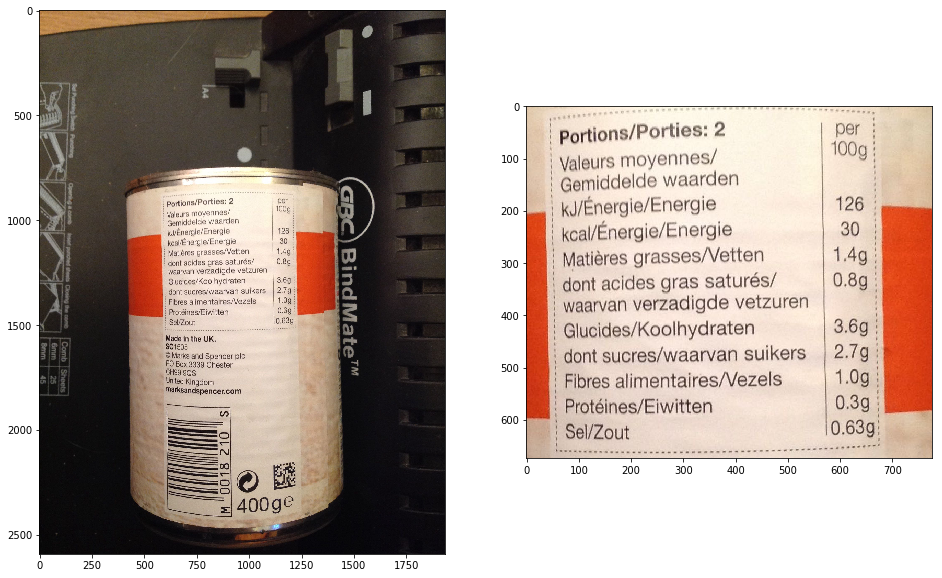

{'fiber_value': 1, 'sodium_100g': 0.252, 'salt_unit': '', 'sodium_value': 0.252, 'sugars': 2.7, 'nutrition-score-fr': 1, 'fat_value': 1.4, 'sodium': 0.252, 'sugars_value': 2.7, 'salt_value': 0.63, 'fat': 1.4, 'salt_100g': 0.63, 'proteins_100g': 0.3, 'nutrition-score-fr_100g': 1, 'nutrition-score-uk_serving': 1, 'sodium_unit': 'g', 'proteins': 0.3, 'fiber_unit': 'g', 'carbohydrates_value': 3.6, 'saturated-fat_100g': 0.8, 'sugars_100g': 2.7, 'nutrition-score-uk_100g': 1, 'energy_unit': 'kcal', 'saturated-fat_unit': '', 'carbohydrates': 3.6, 'saturated-fat': 0.8, 'nutrition-score-uk': 1, 'fiber': 1, 'energy': 126, 'sugars_unit': '', 'energy_100g': 126, 'nutrition-score-fr_serving': 1, 'fat_unit': '', 'fat_100g': 1.4, 'carbohydrates_unit': '', 'carbohydrates_100g': 3.6, 'fiber_100g': 1, 'salt': 0.63, 'proteins_unit': '', 'energy_value': 30, 'proteins_value': 0.3, 'saturated-fat_value': 0.8}
--------------------------------------------------
*************************************************

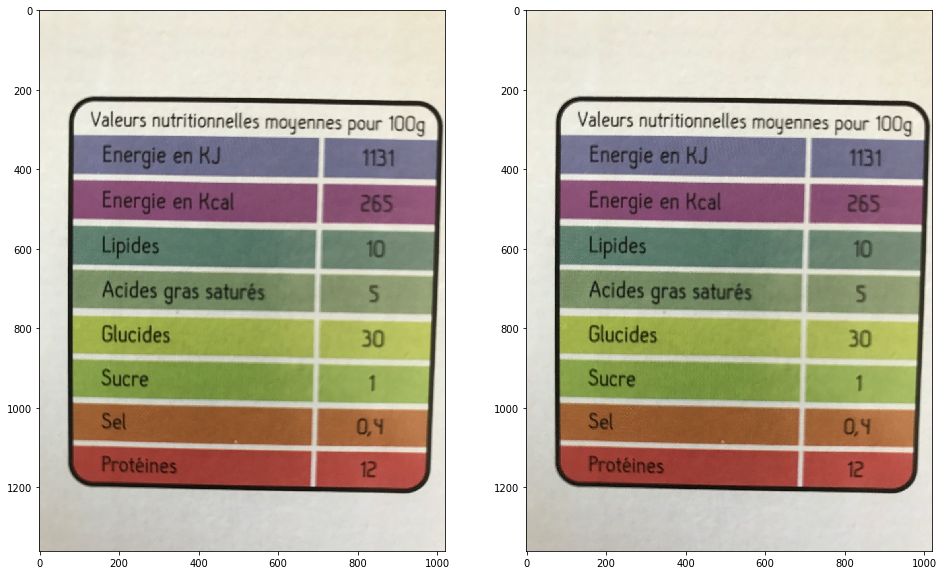

{'proteins_value': 12, 'saturated-fat_value': 5, 'nova-group': 3, 'proteins_unit': '', 'energy_value': 265, 'nova-group_serving': 3, 'salt': 0.4, 'nutrition-score-fr_serving': 3, 'fat_unit': '', 'fat_100g': 10, 'carbohydrates_unit': '', 'carbon-footprint-from-known-ingredients_100g': 50.95, 'carbohydrates_100g': 30, 'sugars_unit': '', 'energy_100g': 1109, 'saturated-fat': 5, 'nutrition-score-uk': 3, 'energy': 1109, 'carbohydrates': 30, 'saturated-fat_unit': '', 'sugars_100g': 1, 'nutrition-score-uk_100g': 3, 'energy_unit': 'kcal', 'carbohydrates_value': 30, 'saturated-fat_100g': 5, 'sodium_unit': 'g', 'proteins': 12, 'nutrition-score-uk_serving': 3, 'proteins_100g': 12, 'nutrition-score-fr_100g': 3, 'fat': 10, 'salt_100g': 0.4, 'sugars_value': 1, 'salt_value': 0.4, 'nova-group_100g': 3, 'nutrition-score-fr': 3, 'fat_value': 10, 'sodium': 0.16, 'sodium_value': 0.16, 'sugars': 1, 'sodium_100g': 0.16, 'salt_unit': ''}
--------------------------------------------------
********************

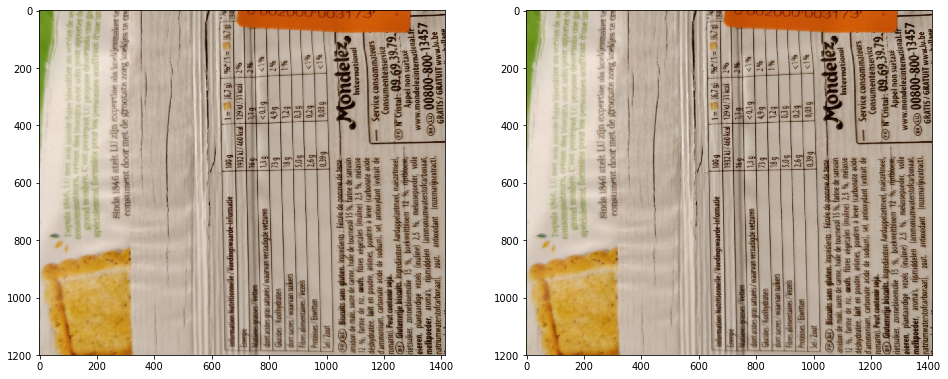

{'proteins': 2.6, 'sodium_unit': 'g', 'saturated-fat_100g': 1.3, 'carbohydrates_value': 73, 'salt_100g': 0.39, 'fat': 16, 'proteins_100g': 2.6, 'sodium': 0.156, 'fat_value': 16, 'sugars_value': 18, 'salt_value': 0.39, 'salt_unit': '', 'sodium_100g': 0.156, 'sodium_value': 0.156, 'sugars': 18, 'energy_value': 460, 'proteins_unit': '', 'proteins_value': 2.6, 'saturated-fat_value': 1.3, 'carbohydrates_unit': '', 'fat_100g': 16, 'carbohydrates_100g': 73, 'fat_unit': '', 'salt': 0.39, 'energy': 1925, 'saturated-fat': 1.3, 'sugars_unit': '', 'energy_100g': 1925, 'energy_unit': 'kcal', 'sugars_100g': 18, 'saturated-fat_unit': '', 'carbohydrates': 73}
--------------------------------------------------
****************************************************************************************************
image id: 0002000005924


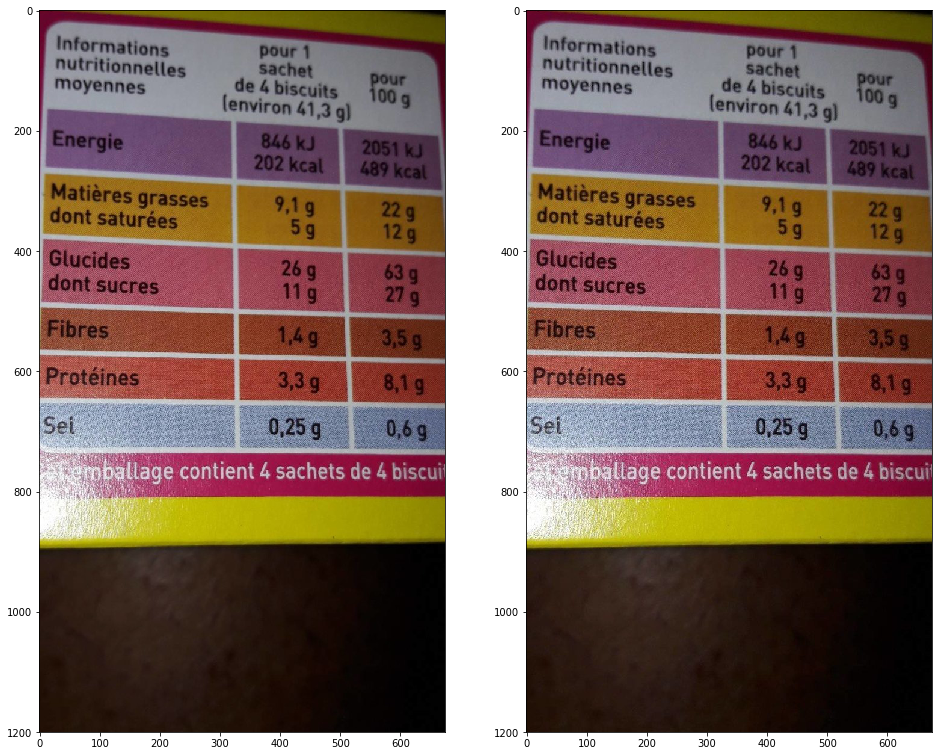

{'sodium_unit': 'g', 'proteins': 8.1, 'carbohydrates_value': 63, 'saturated-fat_100g': 12, 'fat': 22, 'salt_100g': 0.6, 'proteins_100g': 8.1, 'fat_value': 22, 'sodium': 0.24, 'salt_value': 0.6, 'sugars_value': 27, 'sodium_100g': 0.24, 'salt_unit': '', 'sugars': 27, 'sodium_value': 0.24, 'proteins_unit': '', 'energy_value': 489, 'saturated-fat_value': 12, 'proteins_value': 8.1, 'fat_unit': '', 'carbohydrates_100g': 63, 'fat_100g': 22, 'carbohydrates_unit': '', 'salt': 0.6, 'saturated-fat': 12, 'energy': 2046, 'energy_100g': 2046, 'sugars_unit': '', 'sugars_100g': 27, 'energy_unit': 'kcal', 'saturated-fat_unit': '', 'carbohydrates': 63}
--------------------------------------------------
****************************************************************************************************
image id: 0002000006143


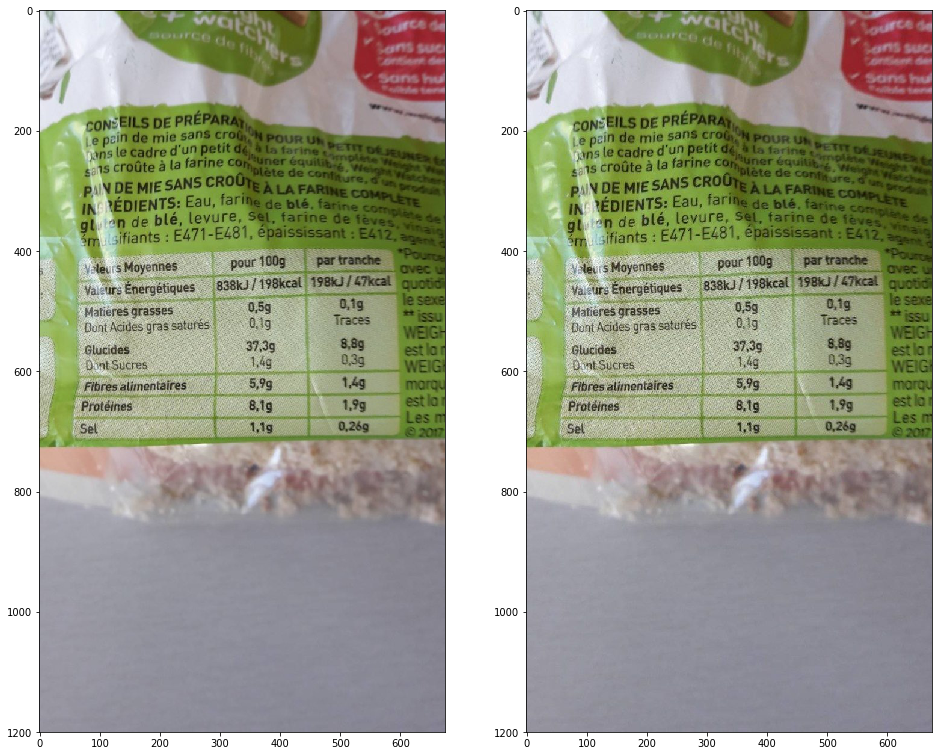

{'saturated-fat_100g': 0.1, 'carbohydrates_value': 37.3, 'proteins': 8.1, 'sodium_unit': 'g', 'nutrition-score-uk_serving': 1, 'proteins_100g': 8.1, 'nutrition-score-fr_100g': 1, 'salt_100g': 1.1, 'fat': 0.5, 'salt_value': 1.1, 'sugars_value': 1.4, 'sodium': 0.44, 'fat_value': 0.5, 'nutrition-score-fr': 1, 'sugars': 1.4, 'sodium_value': 0.44, 'salt_unit': '', 'sodium_100g': 0.44, 'saturated-fat_value': 0.1, 'proteins_value': 8.1, 'energy_value': 198, 'proteins_unit': '', 'salt': 1.1, 'carbohydrates_100g': 37.3, 'fat_100g': 0.5, 'carbohydrates_unit': '', 'fat_unit': '', 'nutrition-score-fr_serving': 1, 'energy_100g': 828, 'sugars_unit': '', 'energy': 828, 'nutrition-score-uk': 1, 'saturated-fat': 0.1, 'saturated-fat_unit': '', 'carbohydrates': 37.3, 'energy_unit': 'kcal', 'sugars_100g': 1.4, 'nutrition-score-uk_100g': 1}
--------------------------------------------------
****************************************************************************************************
image id: 000200

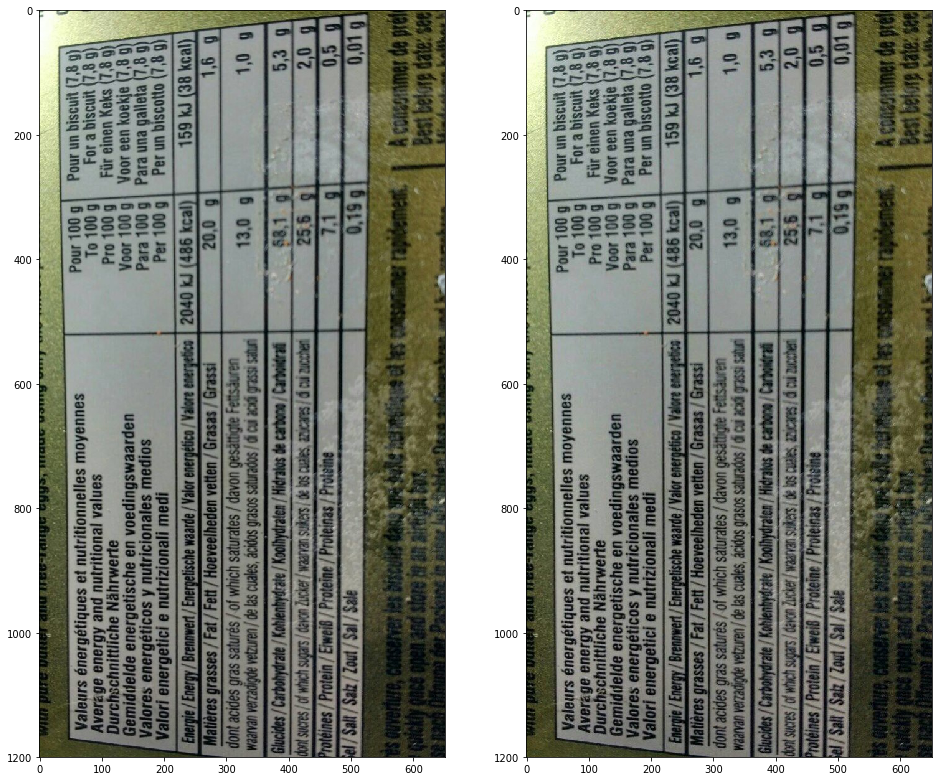

{'salt': 0.19, 'fat_unit': 'g', 'carbohydrates_unit': 'g', 'fat_100g': 20, 'carbohydrates_100g': 68.1, 'proteins_value': 7.1, 'saturated-fat_value': 13, 'proteins_unit': 'g', 'energy_value': 486, 'carbohydrates': 68.1, 'saturated-fat_unit': 'g', 'sugars_100g': 25.6, 'energy_unit': 'kcal', 'sugars_unit': 'g', 'energy_100g': 2033, 'saturated-fat': 13, 'energy': 2033, 'proteins_100g': 7.1, 'fat': 20, 'salt_100g': 0.19, 'carbohydrates_value': 68.1, 'saturated-fat_100g': 13, 'sodium_unit': 'g', 'proteins': 7.1, 'sodium_value': 0.076, 'sugars': 25.6, 'sodium_100g': 0.076, 'salt_unit': 'g', 'sugars_value': 25.6, 'salt_value': 0.19, 'fat_value': 20, 'sodium': 0.076}
--------------------------------------------------
****************************************************************************************************
image id: 0002000010539


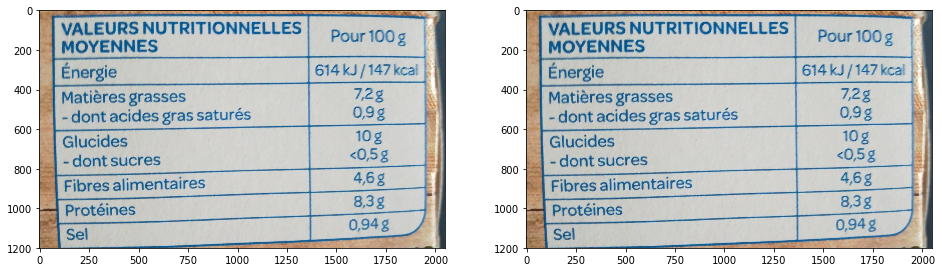

{'saturated-fat_value': 0.9, 'proteins_value': 8.3, 'proteins_unit': '', 'energy_value': 147, 'salt': 0.94, 'fat_unit': '', 'carbohydrates_100g': 10, 'fat_100g': 7.2, 'carbohydrates_unit': '', 'energy_100g': 615, 'sugars_unit': '', 'saturated-fat': 0.9, 'energy': 615, 'saturated-fat_unit': '', 'carbohydrates': 10, 'sugars_100g': 0.5, 'energy_unit': 'kcal', 'carbohydrates_value': 10, 'saturated-fat_100g': 0.9, 'sodium_unit': 'g', 'proteins': 8.3, 'proteins_100g': 8.3, 'fat': 7.2, 'salt_100g': 0.94, 'salt_value': 0.94, 'sugars_value': 0.5, 'fat_value': 7.2, 'sodium': 0.376, 'sugars': 0.5, 'sodium_value': 0.376, 'sodium_100g': 0.376, 'salt_unit': ''}
--------------------------------------------------
****************************************************************************************************
image id: 0002000012847


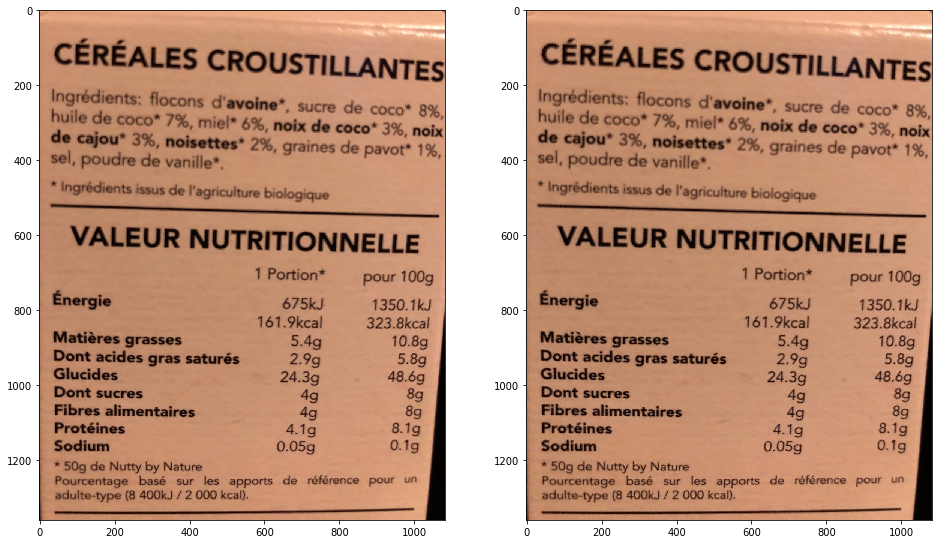

{'sugars_value': 8, 'salt_value': 0.1, 'fat_value': 10.8, 'sodium': 0.04, 'sodium_value': 0.04, 'sugars': 8, 'sodium_100g': 0.04, 'fiber_value': 8, 'salt_unit': '', 'carbohydrates_value': 48.6, 'saturated-fat_100g': 5.8, 'sodium_unit': 'g', 'fiber_unit': '', 'proteins': 8.1, 'proteins_100g': 8.1, 'carbon-footprint-from-known-ingredients_product': 3.15, 'fat': 10.8, 'salt_100g': 0.1, 'sugars_unit': '', 'energy_100g': 1351, 'saturated-fat': 5.8, 'fiber': 8, 'energy': 1351, 'carbohydrates': 48.6, 'saturated-fat_unit': '', 'sugars_100g': 8, 'energy_unit': 'kcal', 'proteins_value': 8.1, 'saturated-fat_value': 5.8, 'proteins_unit': '', 'energy_value': 323, 'fiber_100g': 8, 'salt': 0.1, 'fat_unit': '', 'fat_100g': 10.8, 'carbohydrates_unit': '', 'carbohydrates_100g': 48.6, 'carbon-footprint-from-known-ingredients_100g': 0.9}
--------------------------------------------------
****************************************************************************************************
image id: 00020000

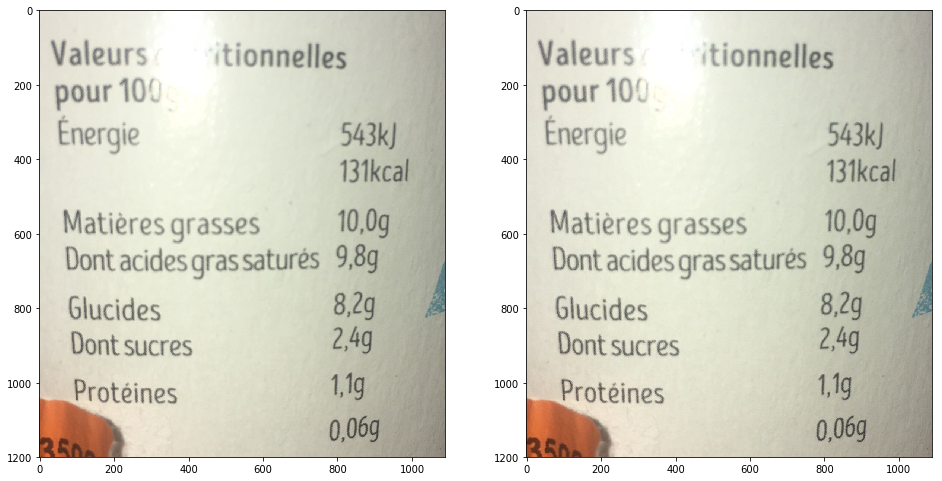

{'salt_100g': 0.06, 'fat': 10, 'proteins_100g': 1.1, 'proteins': 1.1, 'sodium_unit': 'g', 'saturated-fat_100g': 9.8, 'carbohydrates_value': 8.2, 'salt_unit': 'g', 'sodium_100g': 0.024, 'sugars': 2.4, 'sodium_value': 0.024, 'sodium': 0.024, 'fat_value': 10, 'salt_value': 0.06, 'sugars_value': 2.4, 'carbohydrates_100g': 8.2, 'fat_100g': 10, 'carbohydrates_unit': 'g', 'fat_unit': 'g', 'salt': 0.06, 'energy_value': 131, 'proteins_unit': 'g', 'saturated-fat_value': 9.8, 'proteins_value': 1.1, 'energy_unit': 'kcal', 'sugars_100g': 2.4, 'carbohydrates': 8.2, 'saturated-fat_unit': 'g', 'energy': 548, 'saturated-fat': 9.8, 'energy_100g': 548, 'sugars_unit': 'g'}
--------------------------------------------------
****************************************************************************************************
image id: 00022941


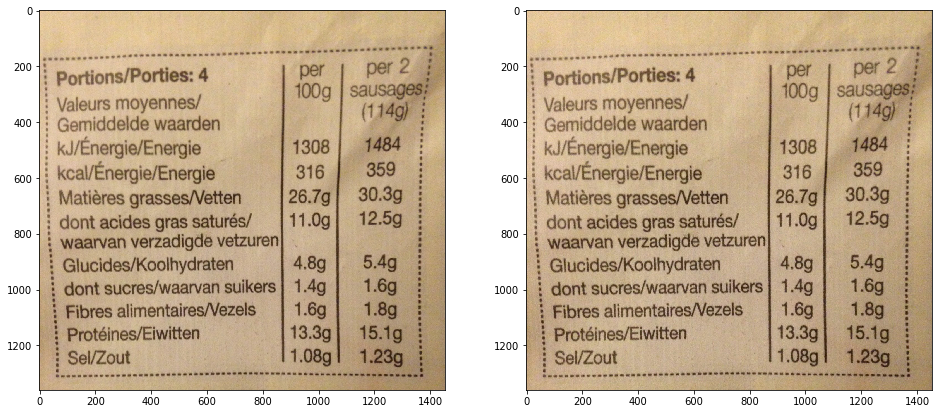

{'sugars_100g': 1.4, 'energy_unit': 'kcal', 'saturated-fat_unit': '', 'carbohydrates': 4.8, 'saturated-fat': 11, 'energy': 1322, 'fiber': 1.6, 'energy_100g': 1322, 'sugars_unit': '', 'fat_unit': '', 'carbohydrates_100g': 4.8, 'carbohydrates_unit': '', 'fat_100g': 26.7, 'nova-group_serving': 4, 'fiber_100g': 1.6, 'salt': 1.08, 'proteins_unit': '', 'nova-group': 4, 'energy_value': 316, 'saturated-fat_value': 11, 'proteins_value': 13.3, 'fiber_value': 1.6, 'sodium_100g': 0.432, 'salt_unit': '', 'sugars': 1.4, 'sodium_value': 0.432, 'nova-group_100g': 4, 'fat_value': 26.7, 'sodium': 0.432, 'salt_value': 1.08, 'sugars_value': 1.4, 'fat': 26.7, 'salt_100g': 1.08, 'proteins_100g': 13.3, 'sodium_unit': 'g', 'proteins': 13.3, 'fiber_unit': '', 'carbohydrates_value': 4.8, 'saturated-fat_100g': 11}
--------------------------------------------------
****************************************************************************************************
image id: 00078085


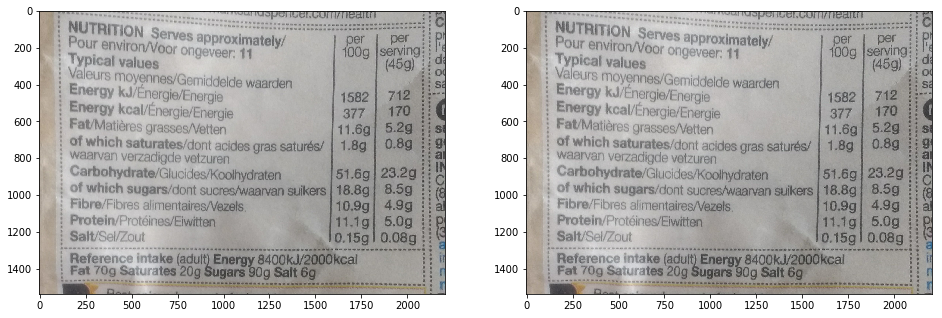

{'energy': 1577, 'fiber': 10.9, 'saturated-fat': 1.8, 'energy_100g': 1577, 'sugars_unit': 'g', 'energy_unit': 'kcal', 'sugars_100g': 18.8, 'sodium_serving': 0.027, 'saturated-fat_unit': 'g', 'carbohydrates': 51.6, 'energy_value': 377, 'fiber_serving': 4.91, 'proteins_unit': 'g', 'saturated-fat_serving': 0.81, 'saturated-fat_value': 1.8, 'proteins_value': 11.1, 'carbohydrates_100g': 51.6, 'carbon-footprint-from-known-ingredients_100g': 33.3, 'fat_100g': 11.6, 'carbohydrates_unit': 'g', 'fat_unit': 'g', 'carbohydrates_serving': 23.2, 'salt': 0.15, 'fiber_100g': 10.9, 'proteins_serving': 5, 'fat_serving': 5.22, 'sodium': 0.06, 'fat_value': 11.6, 'energy_serving': 710, 'salt_value': 0.15, 'sugars_serving': 8.46, 'sugars_value': 18.8, 'salt_unit': 'g', 'sodium_100g': 0.06, 'fiber_value': 10.9, 'sugars': 18.8, 'sodium_value': 0.06, 'proteins': 11.1, 'fiber_unit': 'g', 'sodium_unit': 'g', 'salt_serving': 0.0675, 'saturated-fat_100g': 1.8, 'carbohydrates_value': 51.6, 'salt_100g': 0.15, 'fat':

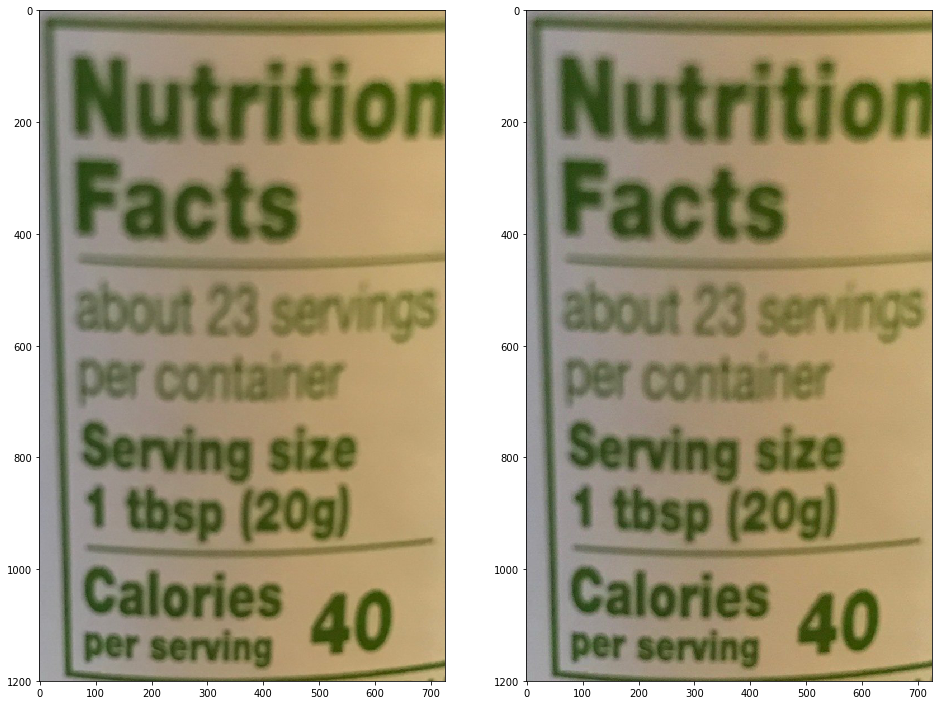

{'proteins_unit': 'g', 'saturated-fat_serving': 0, 'energy_value': 200, 'fiber_serving': 0, 'trans-fat_value': 0, 'nutrition-score-fr_serving': 11, 'carbohydrates_100g': 44.44, 'fat_100g': 0, 'calcium_value': 0, 'fat_serving': 0, 'vitamin-a_value': 0, 'salt': 0, 'proteins_serving': 0, 'fiber': 0, 'energy': 837, 'vitamin-a_unit': 'IU', 'energy_100g': 837, 'cholesterol_unit': 'mg', 'sugars_100g': 44.44, 'energy_unit': 'kcal', 'carbohydrates': 44.44, 'cholesterol_value': 0, 'salt_serving': 0, 'proteins': 0, 'cholesterol_100g': 0, 'saturated-fat_100g': 0, 'vitamin-c': 0.0833, 'cholesterol_serving': 0, 'iron_unit': 'mg', 'nutrition-score-fr_100g': 11, 'proteins_100g': 0, 'vitamin-c_unit': 'mg', 'fat_value': 0, 'nova-group_100g': 4, 'iron_100g': 0, 'sugars_serving': 8, 'salt_value': 0, 'sugars_value': 44.44, 'energy_serving': 151, 'vitamin-c_100g': 0.0833, 'iron_value': 0, 'sodium_100g': 0, 'trans-fat_serving': 0, 'calcium_serving': 0, 'salt_unit': 'g', 'sodium_value': 0, 'nova-group': 4, 'v

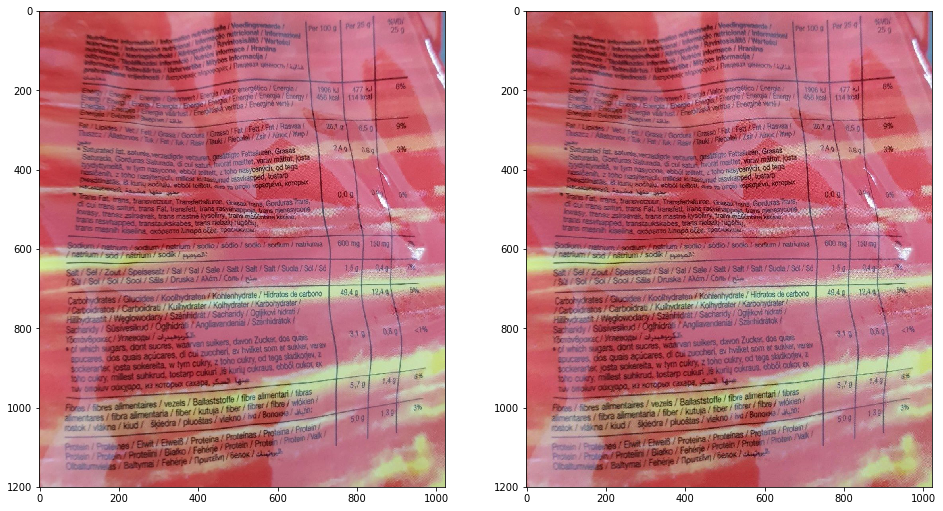

{'nutrition-score-uk_100g': 17, 'sugars_100g': 3.1, 'energy_unit': 'kcal', 'saturated-fat_unit': '', 'carbohydrates': 49.4, 'nutrition-score-uk': 17, 'saturated-fat': 2.4, 'energy': 1908, 'energy_100g': 1908, 'sugars_unit': '', 'fat_unit': '', 'carbohydrates_100g': 49.4, 'fat_100g': 26.1, 'carbohydrates_unit': '', 'salt': 5.7, 'proteins_unit': '', 'energy_value': 456, 'saturated-fat_value': 2.4, 'proteins_value': 5, 'sodium_100g': 2.28, 'salt_unit': '', 'sugars': 3.1, 'sodium_value': 2.28, 'nutrition-score-fr': 17, 'fat_value': 26.1, 'sodium': 2.28, 'salt_value': 5.7, 'sugars_value': 3.1, 'fat': 26.1, 'salt_100g': 5.7, 'nutrition-score-fr_100g': 17, 'proteins_100g': 5, 'sodium_unit': 'g', 'proteins': 5, 'carbohydrates_value': 49.4, 'saturated-fat_100g': 2.4}
--------------------------------------------------
****************************************************************************************************
Total displayed images: 17


In [3]:
total_displayed_images = 0

for img_id in sample_img_ids_v0:
    try:
        explore_image(img_id, base_path)
        total_displayed_images += 1
    except:
        continue
        
print("Total displayed images: %d" %total_displayed_images)

## Insights 

<div class="alert alert-block alert-success">

<h3> Data Description: </h3>

<ul>
  <li> Less cropped_json files than the total number of original images (approximately half)</li>
  <li>Unreadable nutrition table: <mark>0000247016406</mark>, <mark>0011359645156</mark></li>
  <li>Bad table orientation: <mark>0002000003173</mark>; <mark>0002000008314</mark></li>
  <li>Table not well cropped: <mark>0000901881036</mark></li>
  <li>Bad table orientation: <mark>0002000003173</mark>; <mark>0002000008314</mark></li>
  <li>Image-unrelated values in the json data. Ex: energy_100g = 126; <mark>0000901881036</mark></li>
  <li>Missing values in the json data. EX: sugar_unit (g): <mark>0000901881036</mark></li>
  <li>Absence of the nutrition table <mark>0000247016406</mark></li>

</ul>


<h3> Data enhancement: </h3>

<ul>
<li> Data processing seems to be very likely to make a difference and make images more suitable for automatic information extraction: </li>
<ul>
    <li> Enhance image brightness </li>
    <li> Noise removal </li>
    <li> contrast adjustment </li>
    <li> Image debluring (using Wiener Filter) </li>
    <li> Image orientation  </li>
</ul>
<li> separate text images from the table images </li>
</ul>

<h3> Ideas to go deeper </h3>
<ul> 
    <li> Take several pictures of the same product </li>
    <li> In case the nutrition table is too big, suggest to take parts  </li>of it (upper half then lower half for example) and then combine the results (otherwise the the image might be blur with small text size)
    <li> Real time table detection (the user would change the phone  </li>position until the table is detected, this would reduce the bad quality images cause by a missed shot.
    <li> Ask to take a second picture if the table is not detected </li>
</ul>
</div>